In [1]:

from __future__ import absolute_import
from __future__ import division
from __future__ import print_function


import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['figure.figsize'] = (4.0, 4.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'


import os
import imlib as im
import skimage.measure as skm

# import argparse
import datetime
from functools import partial
import json
# import traceback

import imlib as im
import numpy as np
import pylib
import data
import models

import tensorflow as tf
import tflib as tl

%load_ext autoreload
%autoreload 2

tf.get_logger().setLevel('ERROR')

def imshow_noax(img, normalize=False):
    """ Tiny helper to show images as uint8 and remove axis labels """
    if normalize:
        img_max, img_min = np.max(img), np.min(img)
        img = 255.0 * (img - img_min) / (img_max - img_min)
    plt.imshow(img.astype('uint8'))
    plt.gca().axis('off')

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



In [42]:
psnr = np.zeros(int(imr.shape[0]/128))
ssim = np.zeros(int(imr.shape[0]/128))
for i in range(0,psnr.shape[0]):
    psnr[i] = skm.compare_psnr(imr[i*128:(i+1)*128,:128], imr[i*128:(i+1)*128,128+12:128+12+128])
    ssim[i] = skm.compare_ssim(imr[i*128:(i+1)*128,:128], imr[i*128:(i+1)*128,128+12:128+12+128], multichannel=True)
print(psnr.mean(), ssim.mean())

/homes/jhuangbo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.
/homes/jhuangbo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:5: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  """


11.819740391295781 0.883556031530679


In [2]:
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

In [7]:
dataroot = "../dataset/anidata"

experiment_name = 'mmm'
atts = ["blonde_hair", "blue_hair", "pink_hair", "green_hair", "silver_hair",\
        "red_eyes", "blue_eyes", "green_eyes",\
        "long_hair", "short_hair", "twintails", "drill_hair", "ponytail", "blush", "smile", "open_mouth", "hat", "ribbon", "glasses"]
epoch = 300
sample_freq = 0
n_sample = 400

lr_base = 2e-4


threads = -1
n_att = len(atts)
img_size = 128
shortcut_layers, inject_layers = 4, 4
enc_dim, dec_dim, dis_dim = 64, 64, 64
dis_fc_dim = 1024
enc_layers, dec_layers, dis_layers = 5, 5, 5

label = 'diff'
use_stu = True
stu_dim = 64
stu_layers = 4
stu_inject_layers =  4
stu_kernel_size = 3
stu_norm = 'none'
stu_state = 'stu'
multi_inputs = 1
rec_loss_weight = 100
one_more_conv = 0

mode = 'dcgan'
init_epoch = 100
batch_size = 32
n_d = 5
thres_int = 0.5
test_int = 1
save_freq = 0
# others
use_cropped_img = True
crop_ = not use_cropped_img
num_ckpt = 1
clear = True


In [10]:
# ==============================================================================
# =                                   graphs                                   =
# ==============================================================================

tf.reset_default_graph()
# data
if threads >= 0:
    cpu_config = tf.ConfigProto(intra_op_parallelism_threads = threads//2,
                                inter_op_parallelism_threads = threads//2,
                                device_count = {'CPU': threads})
    sess = tf.Session(config=cpu_config)
else:
    sess = tl.session()

tr_data = data.Celeba(dataroot, atts, img_size, batch_size, part='train', sess=sess, crop=crop_)
val_data = data.Celeba(dataroot, atts, img_size, n_sample, part='val', shuffle=False, sess=sess, crop=crop_)

# models
Genc = partial(models.Genc, dim=enc_dim, n_layers=enc_layers, multi_inputs=multi_inputs)
Gdec = partial(models.Gdec, dim=dec_dim, n_layers=dec_layers, shortcut_layers=shortcut_layers,
               inject_layers=inject_layers, one_more_conv=one_more_conv)
Gstu = partial(models.Gstu, dim=stu_dim, n_layers=stu_layers, inject_layers=stu_inject_layers,
               kernel_size=stu_kernel_size, norm=stu_norm, pass_state=stu_state)
D = partial(models.D, n_att=n_att, dim=dis_dim, fc_dim=dis_fc_dim, n_layers=dis_layers)

# inputs
lr = tf.placeholder(dtype=tf.float32, shape=[])

xa = tr_data.batch_op[0]
a = tr_data.batch_op[1]
b = tf.random_shuffle(a)
_a = (tf.to_float(a) * 2 - 1) * thres_int
_b = (tf.to_float(b) * 2 - 1) * thres_int

xa_sample = tf.placeholder(tf.float32, shape=[None, img_size, img_size, 3])
_b_sample = tf.placeholder(tf.float32, shape=[None, n_att])
raw_b_sample = tf.placeholder(tf.float32, shape=[None, n_att])

# generate
z = Genc(xa)
zb = Gstu(z, _b-_a if label=='diff' else _b) if use_stu else z
xb_ = Gdec(zb, _b-_a if label=='diff' else _b)
with tf.control_dependencies([xb_]):
    za = Gstu(z, _a-_a if label=='diff' else _a) if use_stu else z
    xa_ = Gdec(za, _a-_a if label=='diff' else _a)

# discriminate
xa_logit_gan, xa_logit_att = D(xa)
xb__logit_gan, xb__logit_att = D(xb_)

# discriminator losses
wd = tf.reduce_mean(xa_logit_gan) - tf.reduce_mean(xb__logit_gan)
d_loss_gan = -wd
gp = models.gradient_penalty(D, xa, xb_)

xa_loss_att = tf.losses.sigmoid_cross_entropy(a, xa_logit_att)

d_loss = d_loss_gan + gp * 10.0 + xa_loss_att

# generator losses
xb__loss_gan = -tf.reduce_mean(xb__logit_gan)

xb__loss_att = tf.losses.sigmoid_cross_entropy(b, xb__logit_att)
xa__loss_rec = tf.losses.absolute_difference(xa, xa_)

g_loss = xb__loss_gan + xb__loss_att * 10.0 + xa__loss_rec * rec_loss_weight

# optim
d_var = tl.trainable_variables('D')
d_step = tf.train.AdamOptimizer(lr, beta1=0.5).minimize(d_loss, var_list=d_var)

g_var = tl.trainable_variables('G')
g_step = tf.train.AdamOptimizer(lr, beta1=0.5).minimize(g_loss, var_list=g_var)

show_weights = True

d_summary = tl.summary({
    d_loss_gan: 'd_loss_gan',
    gp: 'gp',
    xa_loss_att: 'xa_loss_att',
}, scope='D')

lr_summary = tl.summary({lr: 'lr'}, scope='Learning_Rate')


g_summary = tl.summary({
    xb__loss_gan: 'xb__loss_gan',
    xb__loss_att: 'xb__loss_att',
    xa__loss_rec: 'xa__loss_rec',
}, scope='G')
if show_weights:
    d_histogram = tf.summary.merge([tf.summary.histogram(
        name=i.name,
        values=i
    ) for i in tf.get_collection(tf.GraphKeys.MODEL_VARIABLES, 'D')])

    genc_histogram = tf.summary.merge([tf.summary.histogram(
        name=i.name,
        values=i
    ) for i in tf.get_collection(tf.GraphKeys.MODEL_VARIABLES, 'Genc')])

    gdec_histogram = tf.summary.merge([tf.summary.histogram(
        name=i.name,
        values=i
    ) for i in tf.get_collection(tf.GraphKeys.MODEL_VARIABLES, 'Gdec')])

    gstu_histogram = tf.summary.merge([tf.summary.histogram(
        name=i.name,
        values=i
    ) for i in tf.get_collection(tf.GraphKeys.MODEL_VARIABLES, 'Gstu')])

    d_summary = tf.summary.merge([d_summary, lr_summary, d_histogram])
    g_summary = tf.summary.merge([g_summary, genc_histogram, gdec_histogram, gstu_histogram])
else:
    d_summary = tf.summary.merge([d_summary, lr_summary])

# sample
test_label = _b_sample - raw_b_sample if label=='diff' else _b_sample
if use_stu:
    x_sample = Gdec(Gstu(Genc(xa_sample, is_training=False),
                         test_label, is_training=False), test_label, is_training=False)
else:
    x_sample = Gdec(Genc(xa_sample, is_training=False), test_label, is_training=False)

print("done")

36541
36541
done


NOTE: Initializing all parameters...
iter 0
iter 1
iter 2
iter 3
iter 4
sampling...


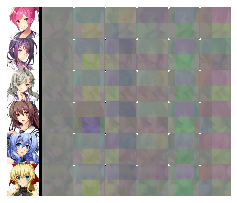

iter 5
iter 6
iter 7
iter 8
iter 9
sampling...


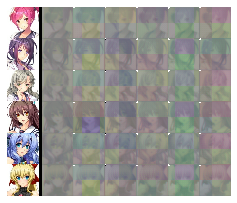

iter 10
iter 11
iter 12
iter 13
iter 14
sampling...


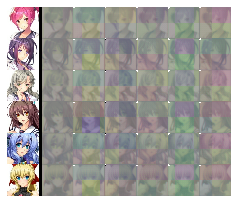

iter 15
iter 16
iter 17
iter 18
iter 19
sampling...


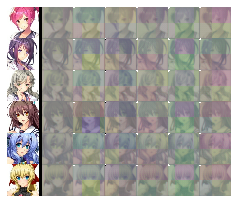

iter 20
iter 21
iter 22
iter 23
iter 24
sampling...


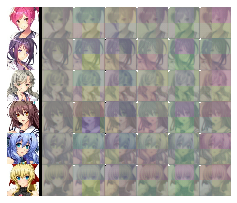

iter 25
iter 26
iter 27
iter 28
iter 29
sampling...


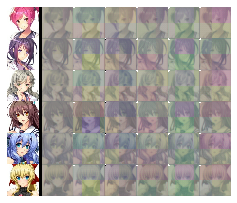

iter 30
iter 31
iter 32
iter 33
iter 34
sampling...


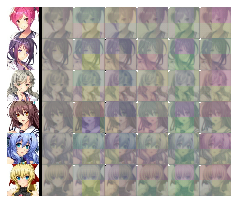

iter 35
iter 36
iter 37
iter 38
iter 39
sampling...


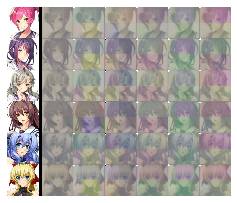

iter 40
iter 41
iter 42
iter 43
iter 44
sampling...


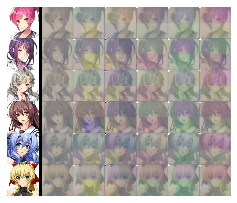

iter 45
iter 46
iter 47
iter 48
iter 49
Epoch: (  0) (   50/  189) Time: 6.124314970998967 s!
sampling...


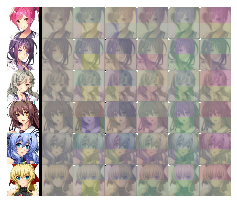

iter 50
iter 51
iter 52
iter 53
iter 54
sampling...


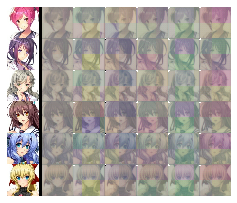

iter 55
iter 56
iter 57
iter 58
iter 59
sampling...


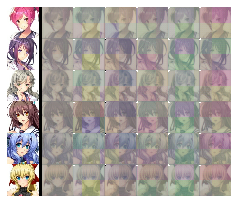

iter 60
iter 61
iter 62
iter 63
iter 64
sampling...


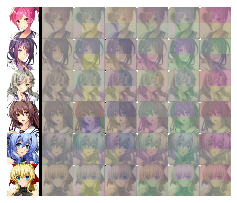

iter 65
iter 66
iter 67
iter 68
iter 69
sampling...


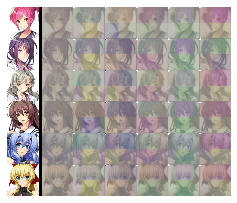

iter 70
iter 71
iter 72
iter 73
iter 74
sampling...


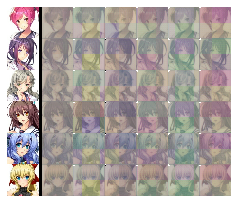

iter 75
iter 76
iter 77
iter 78
iter 79
sampling...


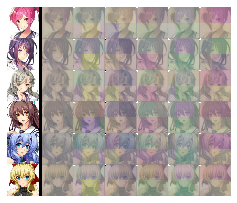

iter 80
iter 81
iter 82
iter 83
iter 84
sampling...


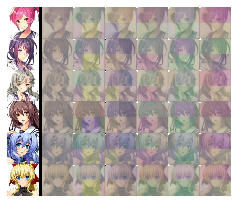

iter 85
iter 86
iter 87
iter 88
iter 89
sampling...


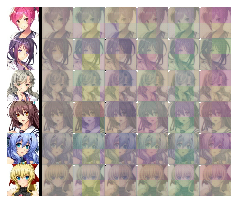

iter 90
iter 91
iter 92
iter 93
iter 94
sampling...


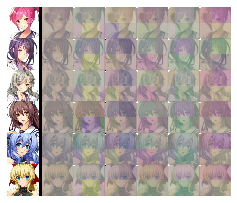

iter 95
iter 96
iter 97
iter 98
iter 99
Epoch: (  0) (  100/  189) Time: 6.094365003998973 s!
sampling...


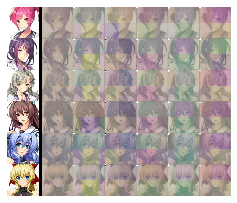

iter 100
iter 101
iter 102
iter 103
iter 104
sampling...


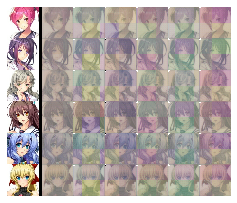

iter 105
iter 106
iter 107
iter 108
iter 109
sampling...


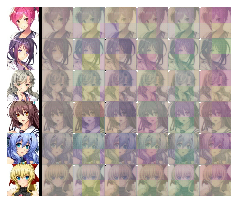

iter 110
iter 111
iter 112
iter 113
iter 114
sampling...


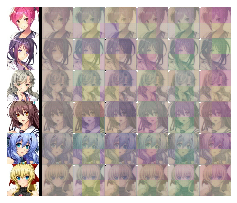

iter 115
iter 116
iter 117
iter 118
iter 119
sampling...


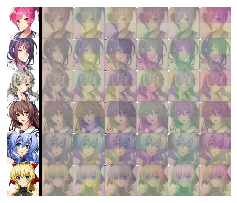

iter 120
iter 121
iter 122
iter 123
iter 124
sampling...


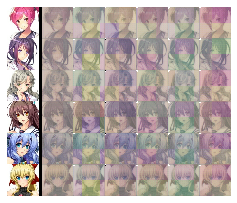

iter 125
iter 126
iter 127
iter 128
iter 129
sampling...


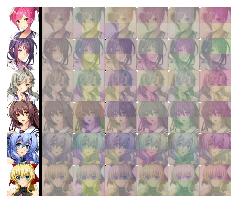

iter 130
iter 131
iter 132
iter 133
iter 134
sampling...


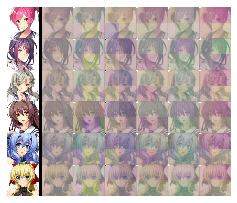

iter 135
iter 136
iter 137
iter 138
iter 139
sampling...


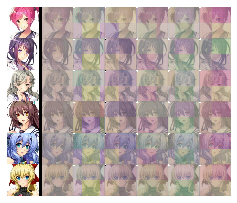

iter 140
iter 141
iter 142
iter 143
iter 144
sampling...


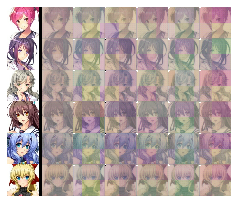

iter 145
iter 146
iter 147
iter 148
iter 149
sampling...


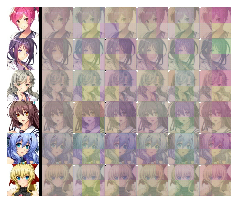

iter 160
iter 161
iter 162
iter 163
iter 164
sampling...


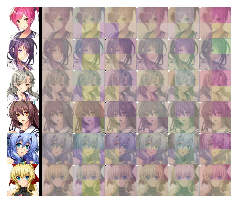

iter 165
iter 166
iter 167
iter 168
iter 169
sampling...


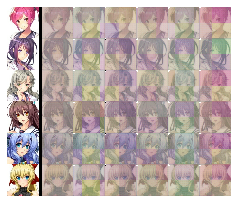

iter 170
iter 171
iter 172
iter 173
iter 174
sampling...


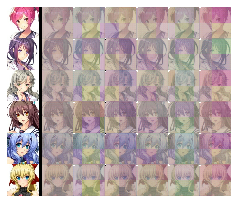

iter 175
iter 176
iter 177
iter 178
iter 179
sampling...


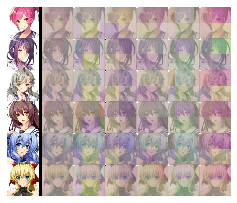

iter 180
iter 181
iter 182
iter 183
iter 184
sampling...


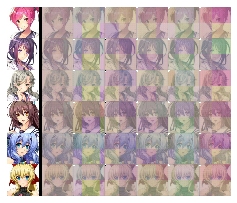

iter 185
iter 186
iter 187
iter 188
Model is saved at ./output/996/checkpoints/Epoch_(0)_(189of189).ckpt!
Model is saved at ./output/996/checkpoints/Epoch_(1)_(189of189).ckpt!
done


NOTE: Initializing all parameters...
iter
iter
iter
iter
iter
sampling...


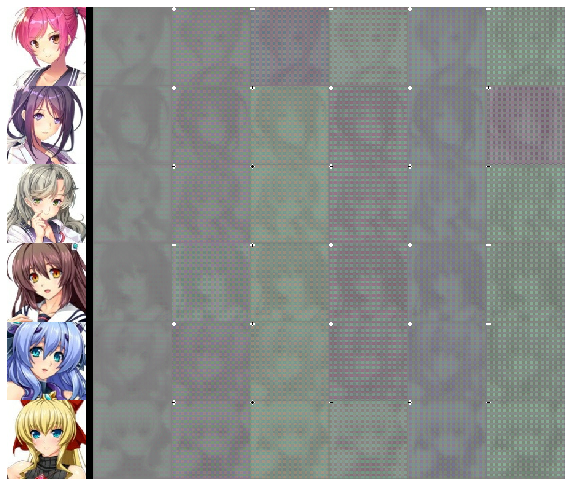

iter
iter
iter
iter
iter
sampling...


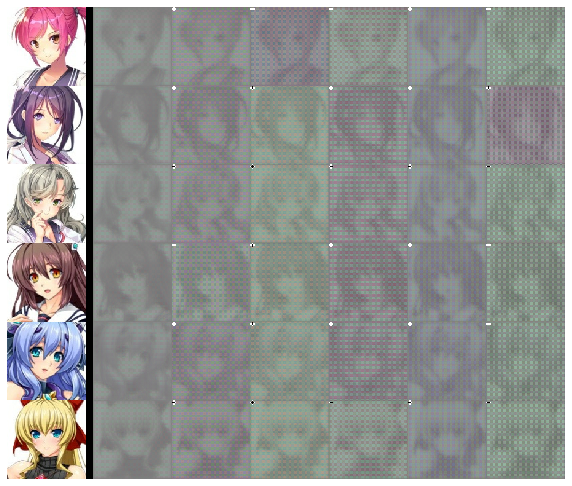

iter
iter
iter
iter
iter
sampling...


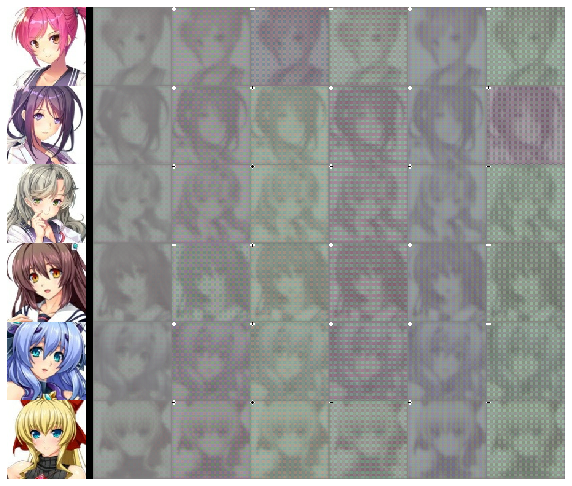

iter
iter
iter
iter
iter
sampling...


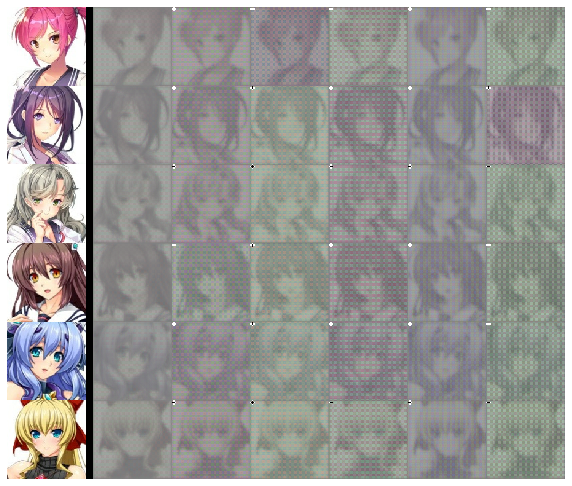

iter
iter
iter
iter
iter
sampling...


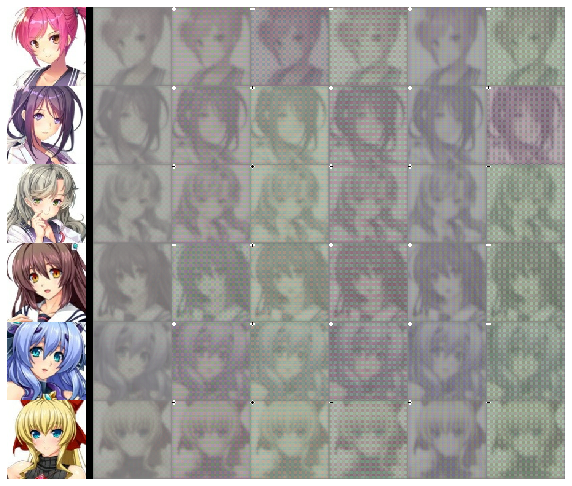

iter
iter


KeyboardInterrupt: 

In [49]:
wgan

NOTE: Initializing all parameters...
1 189
range(0, 189)
iter
iter
iter
iter
iter
sampling...


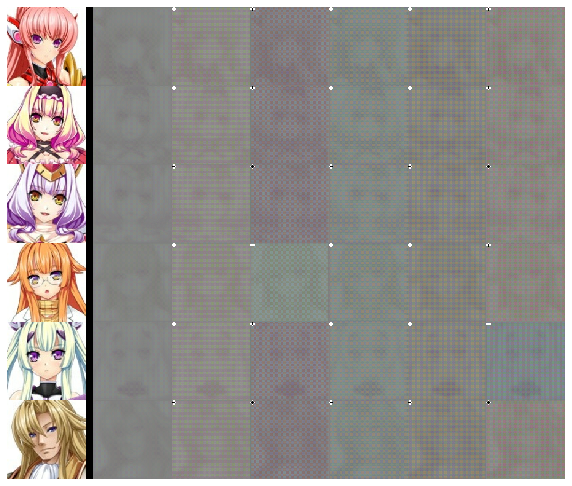

iter
iter
iter
iter
iter
sampling...


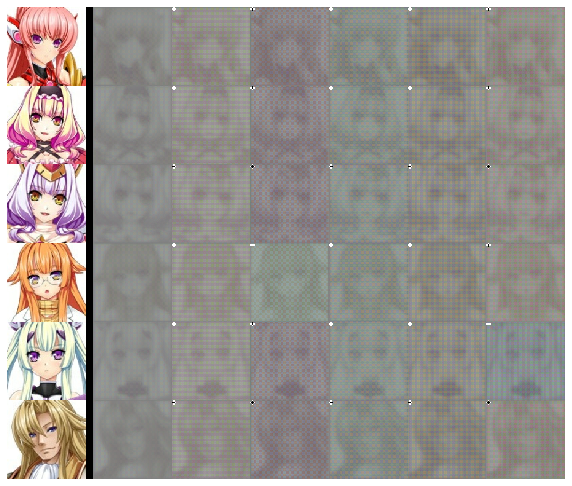

iter
iter
iter
iter
iter
sampling...


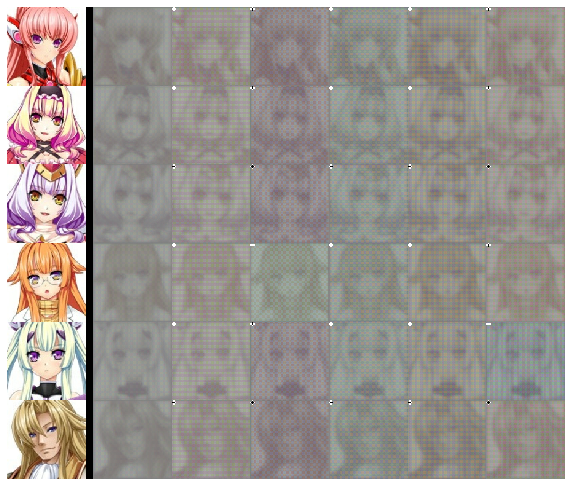

iter
iter
iter
iter
iter
sampling...


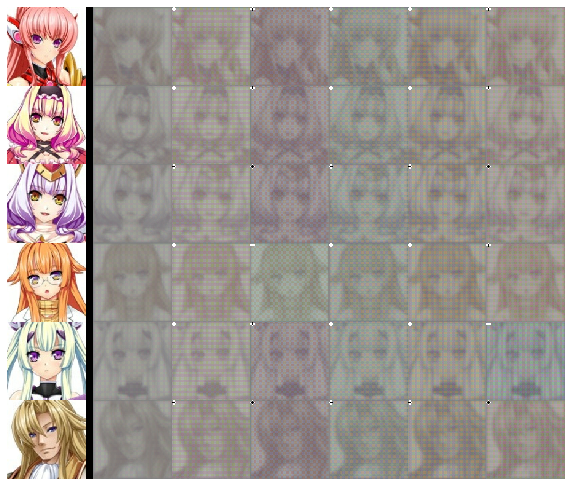

iter
iter
iter
iter
iter
sampling...


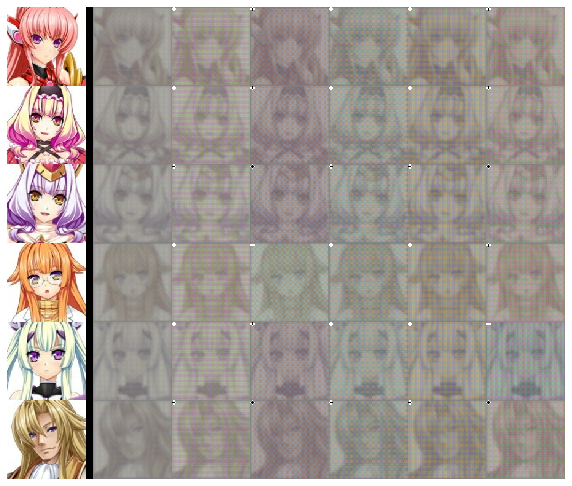

iter


KeyboardInterrupt: 

In [46]:
lsgan

In [79]:
import i2v
from PIL import Image

illust2vec = i2v.make_i2v_with_chainer(
    "i2v_tag.caffemodel", "tag_list.json")

# In the case of caffe, please use i2v.make_i2v_with_caffe instead:
# illust2vec = i2v.make_i2v_with_caffe(
#     "illust2vec_tag.prototxt", "illust2vec_tag_ver200.caffemodel",
#     "tag_list.json")
# illust2vec.estimate_specific_tags([sample[0, :, :128, :]], atts)

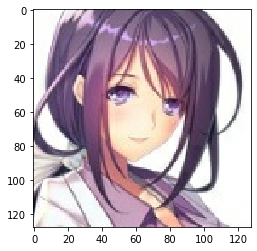

[{'blonde hair': 0.004677236080169678,
  'purple hair': 0.9193663597106934,
  'blue eyes': 0.12645819783210754,
  'pink eyes': 0.000961601734161377,
  'blush': 0.053581178188323975}]

In [109]:

img = (sample[1, :, :128, :]+1)/2
plt.imshow(img)
plt.show()
illust2vec.estimate_specific_tags([img * 256], [i.replace('_', ' ') for i in atts])


In [58]:
print(np.array((x_sample_opt_list)).shape)

ValueError: could not broadcast input array from shape (6,128,128,3) into shape (6,128)

(128, 128, 3)


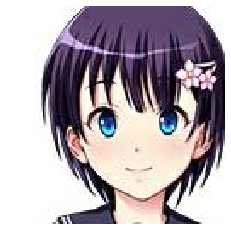

0.0 1.0


[{'general': [('monochrome', 0.7633227109909058),
   ('no humans', 0.5418052077293396),
   ('comic', 0.4431546926498413)],
  'character': [],
  'copyright': [('touhou', 0.3111288547515869)],
  'rating': <zip at 0x7f45ebe4fec8>}]

In [98]:
imr = im.imread('output/ani_exp/sample_training/Epoch_(4)_(189of189).jpg')[:128, :128]

imr = (imr + 1)/2
print(imr.shape)

plt.subplot(1, 1, 1)
imshow_noax(imr, normalize=True)
plt.show()

print(np.min(imr), np.max(imr))
illust2vec.estimate_plausible_tags([imr], threshold=0.2)

In [93]:

import imlib as im
def imshow_noax(img, normalize=False):
    """ Tiny helper to show images as uint8 and remove axis labels """
    if normalize:
        img_max, img_min = np.max(img), np.min(img)
        img = 255.0 * (img - img_min) / (img_max - img_min)
    plt.imshow(img.astype('uint8'))
    plt.gca().axis('off')

In [110]:
val_data = data.Celeba(dataroot, atts, img_size, n_sample, part='val', shuffle=False, sess=sess, crop=crop_)


36799


In [11]:
# ==============================================================================
# =                                    train                                   =
# ==============================================================================

it_cnt, update_cnt = tl.counter()
saver = tf.train.Saver(max_to_keep=num_ckpt)
summary_writer = tf.summary.FileWriter('./output/%s/summaries' % experiment_name, sess.graph)

# initialization
ckpt_dir = './output/%s/checkpoints' % experiment_name
pylib.mkdir(ckpt_dir)

if (clear == False):
    print("Loading parameters...")
    tl.load_checkpoint(ckpt_dir, sess)
else:
    print('NOTE: Initializing all parameters...')
    sess.run(tf.global_variables_initializer())


xa_sample_ipt, a_sample_ipt = val_data.get_next()
b_sample_ipt_list = [a_sample_ipt]  # the first is for reconstruction
for i in range(len(atts)):
    tmp = np.array(a_sample_ipt, copy=True)
    tmp[:, i] = 1 - tmp[:, i]   # inverse attribute
    b_sample_ipt_list.append(tmp)

it_per_epoch = len(tr_data) // (batch_size * (n_d + 1))
max_it = epoch * it_per_epoch
it_range = range(sess.run(it_cnt), max_it)
for it in it_range:
    with pylib.Timer(is_output=False) as t:
        print("iter", it)
        sess.run(update_cnt)

        # which epoch
        epoch2 = it // it_per_epoch
        it_in_epoch = it % it_per_epoch + 1

        # learning rate
        lr_ipt = lr_base / (10 ** (epoch2 // init_epoch))

        # train D
#         print('training D...')
        for i in range(n_d):
            d_summary_opt, _ = sess.run([d_summary, d_step], feed_dict={lr: lr_ipt})
        summary_writer.add_summary(d_summary_opt, it)
        g_summary_opt, _ = sess.run([g_summary, g_step], feed_dict={lr: lr_ipt})
        summary_writer.add_summary(g_summary_opt, it)

        # display
        if (it + 1) % 50 == 0:
            print("Epoch: (%3d) (%5d/%5d) Time: %s!" % (epoch2, it_in_epoch, it_per_epoch, t))

        # save
        if (it + 1) % (save_freq if save_freq else it_per_epoch) == 0:
            save_path = saver.save(sess, '%s/Epoch_(%d)_(%dof%d).ckpt'%(ckpt_dir, epoch2, it_in_epoch, it_per_epoch))
            print('Model is saved at %s!' % save_path)

        # sample
        if (it + 1) % (sample_freq if sample_freq else it_per_epoch) == 0:
            print("sampling...")
            x_sample_opt_list = [xa_sample_ipt, np.full((n_sample, img_size, img_size // 10, 3), -1.0)]
            raw_b_sample_ipt = (b_sample_ipt_list[0].copy() * 2 - 1) * thres_int
            for i, b_sample_ipt in enumerate(b_sample_ipt_list):
                _b_sample_ipt = (b_sample_ipt * 2 - 1) * thres_int
                if i > 0:   # i == 0 is for reconstruction
                    _b_sample_ipt[..., i - 1] = _b_sample_ipt[..., i - 1] * test_int / thres_int
                x_sample_opt_list.append(sess.run(x_sample, feed_dict={xa_sample: xa_sample_ipt,
                                                                       _b_sample: _b_sample_ipt,
                                                                       raw_b_sample: raw_b_sample_ipt}))
                last_images = x_sample_opt_list[-1]
                if i > 0:   # add a mark (+/-) in the upper-left corner to identify add/remove an attribute
                    for nnn in range(last_images.shape[0]):
                        last_images[nnn, 2:5, 0:7, :] = 1.
                        if _b_sample_ipt[nnn, i-1] > 0:
                            last_images[nnn, 0:7, 2:5, :] = 1.
                            last_images[nnn, 1:6, 3:4, :] = -1.
                        last_images[nnn, 3:4, 1:6, :] = -1.
            sample = np.concatenate(x_sample_opt_list, 2)

            plt.imshow(im.immerge((sample+1)/2, n_sample, 1))
            plt.axis('off')
            plt.show()

save_path = saver.save(sess, '%s/Epoch_(%d)_(%dof%d).ckpt' % (ckpt_dir, epoch, it_in_epoch, it_per_epoch))
print('Model is saved at %s!' % save_path)

print("done")

NOTE: Initializing all parameters...
iter 0


KeyboardInterrupt: 